In [45]:
import tensorflow as tf
import numpy as np
import matplotlib as mpl
import IPython.display as display
import PIL.Image
import os
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

from utils.deepdreamvideo import DeepDreamVideo

In [46]:
import optree
print(optree.__version__)


0.15.0


In [47]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("Devices available:", tf.config.list_physical_devices())

TensorFlow version: 2.19.0
Num GPUs Available:  1
Devices available: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


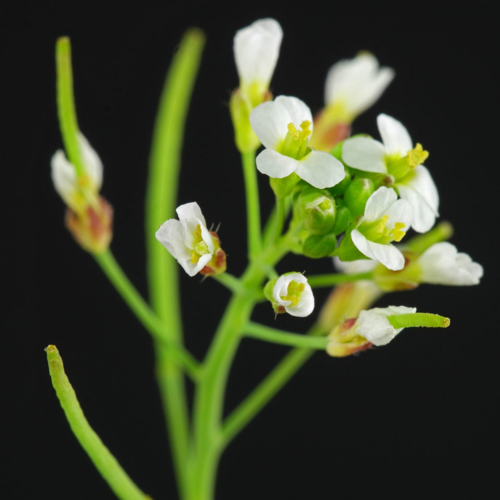

In [48]:
url = "https://pflanzenbestimmung.info/wp-content/uploads/2021/04/Arabidopsis-thaliana-4-1200x1200.jpg"

def download(url, max_dim=None):
  name = url.split('/')[-1]
  image_path = tf.keras.utils.get_file(name, origin=url)
  img = PIL.Image.open(image_path)
  if max_dim:
    img.thumbnail((max_dim, max_dim))
  return np.array(img)

# Normalize an image
def deprocess(img):
  img = 255*(img + 1.0)/2.0
  return tf.cast(img, tf.uint8)

# Display an image
def show(img):
  display.display(PIL.Image.fromarray(np.array(img)))

# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=500)
show(original_img)

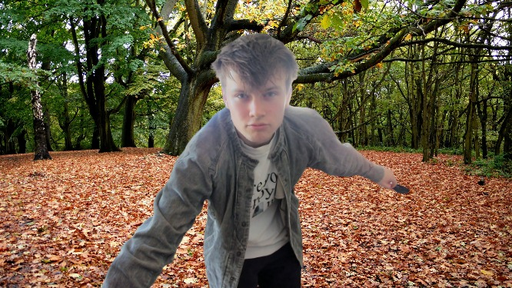

In [49]:
from PIL import Image

original_img = Image.open("pictures/forest_floor_background.jpg")

base_width = 512
w_percent = base_width / float(original_img.size[0])
h_size = int((float(original_img.size[1]) * float(w_percent)))

resized_img = original_img.resize((base_width, h_size), Image.Resampling.LANCZOS)

resized_img.show()

original_img = resized_img


In [50]:
def calc_loss(img, model):
  img_batch = tf.expand_dims(img, axis=0)
  layer_activations = model(img_batch)
  if len(layer_activations) == 1:
    layer_activations = [layer_activations]

  losses = []
  for act in layer_activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  return tf.reduce_sum(losses)

def random_roll(img, maxroll):
  shift = tf.random.uniform(shape=[2], minval=-maxroll, maxval=maxroll, dtype=tf.int32)
  img_rolled = tf.roll(img, shift=shift, axis=[0,1])
  return shift, img_rolled

class TiledGradients(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[2], dtype=tf.int32),
        tf.TensorSpec(shape=[], dtype=tf.int32),)
  )
  def __call__(self, img, img_size, tile_size=512):
    shift, img_rolled = random_roll(img, tile_size)

    # Initialize the image gradients to zero.
    gradients = tf.zeros_like(img_rolled)

    # Skip the last tile, unless there's only one tile.
    xs = tf.range(0, img_size[1], tile_size)[:-1]
    if not tf.cast(len(xs), bool):
      xs = tf.constant([0])
    ys = tf.range(0, img_size[0], tile_size)[:-1]
    if not tf.cast(len(ys), bool):
      ys = tf.constant([0])

    for x in xs:
      for y in ys:
        # Calculate the gradients for this tile.
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img_rolled`.
          # `GradientTape` only watches `tf.Variable`s by default.
          tape.watch(img_rolled)

          # Extract a tile out of the image.
          img_tile = img_rolled[y:y+tile_size, x:x+tile_size]
          loss = calc_loss(img_tile, self.model)

        # Update the image gradients for this tile.
        gradients = gradients + tape.gradient(loss, img_rolled)

    # Undo the random shift applied to the image and its gradients.
    gradients = tf.roll(gradients, shift=-shift, axis=[0,1])

    gradients /= tf.math.reduce_std(gradients) + 1e-8 

    return gradients
  

def run_deep_dream_with_octaves(img, model, steps_per_octave=100, step_size=0.01, 
                                octaves=range(-2,3), octave_scale=1.3, model_name=""):
  base_shape = tf.shape(img)
  img = tf.keras.utils.img_to_array(img)
  img = tf.keras.applications.inception_v3.preprocess_input(img)

  initial_shape = img.shape[:-1]
  img = tf.image.resize(img, initial_shape)
  
  # Create tiled gradients for the specific model
  get_tiled_gradients = TiledGradients(model)
  
  for octave in octaves:
    # Scale the image based on the octave
    new_size = tf.cast(tf.convert_to_tensor(base_shape[:-1]), tf.float32)*(octave_scale**octave)
    new_size = tf.cast(new_size, tf.int32)
    img = tf.image.resize(img, new_size)

    for step in range(steps_per_octave):
      gradients = get_tiled_gradients(img, new_size)
      img = img + gradients*step_size
      img = tf.clip_by_value(img, -1, 1)

      if step % 10 == 0:
        display.clear_output(wait=True)
        show(deprocess(img))
        print(f"Model: {model_name}, Octave {octave}, Step {step}")

  result = deprocess(img)
  return result

In [51]:
os.makedirs("dreams", exist_ok=True)

def compare_deepdreams(original_img, finetuned_model_name, img_name="output", names = ['mixed9', 'mixed10']):
    # Run DeepDream with standard ImageNet model
    print(f"\nRunning DeepDream on {img_name} with standard ImageNet model...")
    
    print("Setting up standard InceptionV3 model...")
    base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
    standard_layers = [base_model.get_layer(name).output for name in names]
    dream_model_standard = tf.keras.Model(inputs=base_model.input, outputs=standard_layers)

    print("\nSetting up fine-tuned model...")
    model_path = finetuned_model_name
    fine_tuned_model = load_model(model_path)
    fine_tuned_layers = [fine_tuned_model.get_layer(name).output for name in names]
    dream_model_finetuned = tf.keras.Model(inputs=fine_tuned_model.input, outputs=fine_tuned_layers)


    img_standard = run_deep_dream_with_octaves(
        img=original_img,
        model=dream_model_standard,
        steps_per_octave=100,
        step_size=0.02,
        octave_scale=1.3,
        model_name="Standard ImageNet"
    )

    img_standard = tf.image.resize(img_standard, tf.shape(original_img)[:-1], method=tf.image.ResizeMethod.LANCZOS3)
    img_standard = tf.image.convert_image_dtype(img_standard / 255.0, dtype=tf.uint8)
    standard_path = f'dreams/standard_{img_name}.jpg'
    Image.fromarray(np.array(img_standard)).save(standard_path)

    # Run DeepDream with fine-tuned model
    print(f"Running DeepDream on {img_name} with fine-tuned model...")
    img_finetuned = run_deep_dream_with_octaves(
        img=original_img,
        model=dream_model_finetuned,
        steps_per_octave=100,
        step_size=0.02,
        octave_scale=1.3,
        model_name="Fine-tuned"
    )

    img_finetuned = tf.image.resize(img_finetuned, tf.shape(original_img)[:-1], method=tf.image.ResizeMethod.LANCZOS3)
    img_finetuned = tf.image.convert_image_dtype(img_finetuned / 255.0, dtype=tf.uint8)
    finetuned_path = f'dreams/finetuned_{img_name}_{str(names)}.jpg'
    Image.fromarray(np.array(img_finetuned)).save(finetuned_path)

    # Side-by-side plot
    print(f"\nSide-by-side comparison for {img_name}:")
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(np.array(img_standard))
    plt.title(f"{img_name} - Standard ImageNet DeepDream")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(np.array(img_finetuned))
    plt.title(f"{img_name} - Fine-tuned DeepDream")
    plt.axis('off')

    # Save the comparison plot
    comparison_path = f'dreams/comparison_{img_name}_{str(names)}.jpg'
    plt.savefig(comparison_path, bbox_inches='tight')
    plt.show()



In [52]:
names = ['mixed4','mixed5', 'mixed6','mixed7', 'mixed8','mixed9', 'mixed10']
for layer1, layer2 in zip(names, names[1:]):
    print(layer1, layer2)

mixed4 mixed5
mixed5 mixed6
mixed6 mixed7
mixed7 mixed8
mixed8 mixed9
mixed9 mixed10


# Enhance Features

In [53]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import PIL.Image
from tensorflow.keras.applications import InceptionV3
import time
import os

class GuidedDeepDream:
    def __init__(self, 
                 model_name='inception_v3',
                 layers=None):
        """
        Initialize the Guided DeepDream model.
        
        Args:
            model_name: Name of the model to use (currently only 'inception_v3' supported)
            layers: List of layer names to use for feature extraction
        """
        self.model_name = model_name
        
        # Store random jitter values for consistent add/remove operations
        self.jitter_dx = 0
        self.jitter_dy = 0
        
        # Initialize the model
        if model_name == 'inception_v3':
            base_model = InceptionV3(include_top=False, weights='imagenet')
            
            # Default layers if none specified
            if layers is None:
                self.layers = ['mixed3', 'mixed5', 'mixed7']
            else:
                self.layers = layers
                
            # Create feature extraction model
            outputs = [base_model.get_layer(name).output for name in self.layers]
            self.model = tf.keras.Model(inputs=base_model.input, outputs=outputs)
            
            # The standard InceptionV3 input size is 299x299, but we'll keep this flexible
            # and use it only as a minimum constraint
            self.min_img_size = (299, 299)
        else:
            raise ValueError(f"Model {model_name} not supported")
        
        print(f"Model initialized with layers: {self.layers}")
    
    def preprocess_image(self, img_path, target_size=None):
        """Load and preprocess image for the model"""
        # Open the image and convert to RGB to ensure 3 channels
        img = PIL.Image.open(img_path).convert("RGB")
        
        # Store original size
        original_size = img.size
        
        # If no target size provided, use the original size but ensure minimum dimensions
        if target_size is None:
            target_size = (max(original_size[0], self.min_img_size[0]),
                          max(original_size[1], self.min_img_size[1]))
        
        # Resize with high-quality LANCZOS resampling
        img = img.resize(target_size, PIL.Image.LANCZOS)
        
        # Convert to numpy array
        img_array = np.array(img)
        
        # Store original shape before preprocessing
        self.original_shape = img_array.shape[:-1]  # Store height, width (exclude channels)
        
        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)
        
        # Apply model-specific preprocessing
        if self.model_name == 'inception_v3':
            img_array = tf.keras.applications.inception_v3.preprocess_input(img_array)
            
        return img_array
    
    def deprocess_image(self, img):
        """Convert processed image back to displayable format with improved quality"""
        img = img.copy()
        
        # Remove batch dimension
        img = img[0]
        
        # Reverse preprocessing based on model
        if self.model_name == 'inception_v3':
            img /= 2.0
            img += 0.5
            
        # Scale to 0-255 range
        img *= 255.0
        
        # Clip values and convert to proper image type
        img = np.clip(img, 0, 255).astype(np.uint8)
        
        return img
    
    def add_jitter(self, image, jitter=32):
        """Add random jitter to image"""
        if jitter > 0:
            # Random shift by up to jitter pixels in each direction
            self.jitter_dx, self.jitter_dy = np.random.randint(-jitter, jitter+1, 2)
            image = tf.roll(image, self.jitter_dx, axis=1)
            image = tf.roll(image, self.jitter_dy, axis=2)
        return image
    
    def remove_jitter(self, image, jitter=32):
        """Remove random jitter from image"""
        if jitter > 0:
            # Remove the shift using the stored dx, dy values
            image = tf.roll(image, -self.jitter_dx, axis=1)
            image = tf.roll(image, -self.jitter_dy, axis=2)
        return image
    
    def calculate_loss(self, dream_features, ref_features, guidance_weight):
        """Calculate the combined loss for guided dreaming"""
        loss = 0
        
        # Weight the layers differently (deeper layers get more weight)
        layer_weights = np.linspace(0.5, 1.0, len(dream_features))
        
        for i, (dream_feat, ref_feat) in enumerate(zip(dream_features, ref_features)):
            # Standard DeepDream part - maximize activation
            # Use channel-wise mean to amplify interesting patterns
            standard_loss = tf.reduce_mean(tf.square(dream_feat))
            
            # Reference guidance part - minimize difference to reference features
            # Normalize to care about patterns not intensity
            dream_feat_norm = dream_feat / (tf.math.reduce_std(dream_feat) + 1e-8)
            ref_feat_norm = ref_feat / (tf.math.reduce_std(ref_feat) + 1e-8)
            
            # Calculate cosine similarity for pattern matching
            # Reshape to flatten the spatial dimensions
            dream_flat = tf.reshape(dream_feat_norm, [tf.shape(dream_feat_norm)[0], -1])
            ref_flat = tf.reshape(ref_feat_norm, [tf.shape(ref_feat_norm)[0], -1])
            
            # Safe operations to avoid shape mismatches
            dot_product = tf.reduce_sum(dream_flat * ref_flat, axis=1)
            dream_norm = tf.sqrt(tf.reduce_sum(tf.square(dream_flat), axis=1) + 1e-8)
            ref_norm = tf.sqrt(tf.reduce_sum(tf.square(ref_flat), axis=1) + 1e-8)
            
            similarity = tf.reduce_mean(dot_product / (dream_norm * ref_norm + 1e-8))
            guidance_loss = similarity  # Higher is better
            
            # Combine losses with layer weight
            layer_weight = layer_weights[i]
            combined_loss = layer_weight * ((1 - guidance_weight) * standard_loss + 
                             guidance_weight * guidance_loss)
            
            loss += combined_loss
            
        return loss
    
    def octave_process(self, 
                    base_img, 
                    ref_imgs,
                    octave_scale=1.3,
                    num_octaves=4,
                    guidance_weight=0.5,
                    iterations_per_octave=20,
                    step_size=0.01,
                    jitter=32,
                    show_progress=True):
        """
        Process the image at different scales for better detail.
        
        Args:
            base_img: Base image tensor
            ref_imgs: List of reference image tensors
            octave_scale: Scale factor between octaves
            num_octaves: Number of octaves scales to process
            guidance_weight: How much to influence with reference (0-1)
            iterations_per_octave: Number of optimization steps per octave
            step_size: Size of each gradient step
            jitter: Amount of random jitter to apply
            show_progress: Whether to show progress images
        """
        # Get the original image shape - ensure it's 1-D for slicing
        original_shape = tf.shape(base_img)[1:3]
        shape_float = tf.cast(original_shape, tf.float32)
        
        # Keep the number of octaves reasonable
        num_octaves = min(num_octaves, 5)  # Limit to 5 octaves maximum
        
        # Generate octave pyramid shapes (handle type conversion properly)
        octave_shapes = []
        min_dim = tf.reduce_min(shape_float).numpy()
        
        # Adjust num_octaves if the image is too small
        while octave_scale ** (num_octaves - 1) > min_dim / 100:
            num_octaves -= 1
            if num_octaves <= 1:
                num_octaves = 1
                break
                
        print(f"Using {num_octaves} octaves based on image size")
        
        # Calculate octave shapes from largest to smallest
        for i in range(num_octaves):
            # Start with the highest resolution and work down
            # This puts the smallest octave at the end of the list
            scale_factor = tf.cast(octave_scale ** (num_octaves - 1 - i), tf.float32)
            new_shape = tf.cast(shape_float / scale_factor, tf.int32)
            # Ensure minimum size of 100 pixels on each dimension
            new_shape = tf.maximum(new_shape, 100)
            octave_shapes.append(new_shape)
        
        # Initialize detail with zeros matching base_img shape
        # Start with the smallest octave (last in our list)
        octave_shape = octave_shapes[-1]
        base_octave = tf.image.resize(base_img, octave_shape, 
                          method=tf.image.ResizeMethod.LANCZOS3)
        detail = tf.zeros_like(base_octave)
        
        if show_progress and num_octaves > 0:
            plt.figure(figsize=(15, 3 * num_octaves))
            
        # Process each octave from smallest to largest
        for i, octave_shape in enumerate(reversed(octave_shapes)):
            print(f"Processing octave {i+1}/{num_octaves} - Size: {octave_shape.numpy()}")
            
            # Resize the base image to current octave size
            octave_base = tf.image.resize(base_img, octave_shape, 
                              method=tf.image.ResizeMethod.LANCZOS3)
            
            # Ensure detail has exactly the same shape as octave_base
            if i > 0:
                # Resize detail to match the current octave shape
                detail = tf.image.resize(detail, octave_shape, 
                         method=tf.image.ResizeMethod.LANCZOS3)
                # Reshape to exactly match octave_base
                detail = tf.reshape(detail, tf.shape(octave_base))
            
            # Combine base and detail
            dream_img = tf.Variable(octave_base + detail)
            
            # Resize reference images to match
            resized_ref_imgs = [tf.image.resize(img, octave_shape, 
                               method=tf.image.ResizeMethod.LANCZOS3) 
                               for img in ref_imgs]
            
            # Process this octave
            result = self.process_single_octave(
                dream_img, 
                resized_ref_imgs,
                guidance_weight=guidance_weight,
                iterations=iterations_per_octave,
                step_size=step_size * (1 - 0.1 * i),  # Reduce step size for larger octaves
                jitter=min(jitter, tf.reduce_min(octave_shape).numpy() // 8)  # Scale jitter with image size
            )
            
            # Extract details by subtracting the original base for this octave
            detail = result - octave_base
            
            # Show intermediate result for this octave
            if show_progress:
                try:
                    plt.subplot(num_octaves, 3, i*3 + 3)
                    plt.imshow(self.deprocess_image(result.numpy()))
                    plt.title(f"Octave {i+1} Result")
                    plt.axis("off")
                except Exception as e:
                    print(f"Warning: Could not display intermediate result: {e}")
            
        # For the final result, resize to original shape with high quality
        final_result = tf.image.resize(result, original_shape, 
                     method=tf.image.ResizeMethod.LANCZOS5)
        
        if show_progress and num_octaves > 0:
            try:
                plt.tight_layout()
                plt.show()
            except Exception as e:
                print(f"Warning: Could not display progress: {e}")
            
        return final_result
        
    def process_single_octave(self, 
                             dream_img, 
                             ref_imgs,
                             guidance_weight=0.5,
                             iterations=20,
                             step_size=0.01,
                             jitter=32):
        """Process a single octave scale"""
        # Calculate reference features once (they don't change during optimization)
        ref_features_list = []
        for img in ref_imgs:
            ref_features_list.append(self.model(img))
            
        # Average the features from all reference images
        ref_features = []
        for i in range(len(self.layers)):
            feature_stack = tf.stack([feat_list[i] for feat_list in ref_features_list], axis=0)
            ref_features.append(tf.reduce_mean(feature_stack, axis=0))
        
        # Learning rate schedule - decrease step size gradually
        lr_schedule = np.linspace(step_size, step_size * 0.6, iterations)
        
        # Set the shape explicitly as a Variable for gradient tracking
        dream_var = tf.Variable(dream_img)
        
        for i in range(iterations):
            current_step_size = lr_schedule[i]
            
            # Add random jitter - this needs to be a variable too for gradient tracking
            jittered_img = self.add_jitter(dream_var, jitter)
            
            # Gradient calculation
            with tf.GradientTape() as tape:
                tape.watch(jittered_img)
                # Forward pass through the model
                dream_features = self.model(jittered_img)
                
                # Calculate loss
                loss = self.calculate_loss(dream_features, ref_features, guidance_weight)
            
            # Compute gradients
            gradients = tape.gradient(loss, jittered_img)
            
            # Normalize gradients for stable updates
            gradients = gradients / (tf.math.reduce_std(gradients) + 1e-8)
            
            # Apply gradients to update the jittered image
            jittered_updated = jittered_img + gradients * current_step_size
            
            # Remove jitter to get the updated dream image
            updated_img = self.remove_jitter(jittered_updated, jitter)
            
            # Clip values to valid range and update the dream image
            dream_var.assign(tf.clip_by_value(updated_img, -1.0, 1.0))
            
            if i % 5 == 0:
                try:
                    loss_value = float(loss.numpy())
                    print(f"  Step {i+1}/{iterations} - Loss: {loss_value:.4f}")
                except:
                    print(f"  Step {i+1}/{iterations} - Loss value not available")
        
        return dream_var
    
    def guided_deepdream(self, 
                         base_img_path, 
                         reference_img_paths,
                         output_path=None,
                         target_size=None,
                         guidance_weight=0.5,
                         octave_scale=1.3,
                         num_octaves=4,
                         iterations_per_octave=20,
                         step_size=0.01,
                         jitter=32,
                         show_original=True,
                         show_progress=True,
                         high_quality=True):
        """
        Enhanced guided DeepDream implementation with improved quality
        
        Args:
            base_img_path: Path to base image to apply effect to
            reference_img_paths: List of paths to reference images
            output_path: Where to save the result (None = don't save)
            target_size: Size to process images at (None = use original size)
            guidance_weight: How much to influence with reference (0-1)
            octave_scale: Scale factor between octaves
            num_octaves: Number of octave scales to process
            iterations_per_octave: Number of optimization steps per octave
            step_size: Size of each gradient step
            jitter: Amount of random jitter to apply
            show_original: Whether to show original images
            show_progress: Whether to show processing progress
            high_quality: Whether to use higher quality resizing
        """
        start_time = time.time()
        
        # Get original image for display and to determine dimensions
        original_img = PIL.Image.open(base_img_path).convert("RGB")
        orig_width, orig_height = original_img.size
        original_size = (orig_width, orig_height)
        
        # Calculate target size for processing if not provided
        if target_size is None:
            # Determine if we need to resize based on constraints
            if high_quality:
                # For high quality, use original size but ensure minimum dimensions
                process_size = (max(orig_width, self.min_img_size[0]), 
                               max(orig_height, self.min_img_size[1]))
            else:
                # For standard quality, use min dimensions
                process_size = self.min_img_size
        else:
            process_size = target_size
        
        print(f"Processing at size: {process_size}")
        
        # Load and preprocess images
        base_img = self.preprocess_image(base_img_path, process_size)
        
        ref_imgs = []
        for img_path in reference_img_paths:
            ref_imgs.append(self.preprocess_image(img_path, process_size))
        
        # Display original images
        if show_original:
            num_refs = min(3, len(reference_img_paths))
            plt.figure(figsize=(5 * (num_refs + 1), 5))
            
            plt.subplot(1, num_refs + 1, 1)
            plt.imshow(original_img)
            plt.title("Base Image")
            plt.axis("off")
            
            for i in range(num_refs):
                plt.subplot(1, num_refs + 1, i + 2)
                plt.imshow(PIL.Image.open(reference_img_paths[i]))
                plt.title(f"Reference {i+1}")
                plt.axis("off")
                
            plt.tight_layout()
            plt.show()
        
        # Process the image through octaves
        print(f"Starting guided dreaming with guidance weight: {guidance_weight}")
        print(f"Octaves: {num_octaves}, Scale: {octave_scale}, Iterations per octave: {iterations_per_octave}")
        
        result = self.octave_process(
            base_img, 
            ref_imgs,
            octave_scale=octave_scale,
            num_octaves=num_octaves,
            guidance_weight=guidance_weight,
            iterations_per_octave=iterations_per_octave,
            step_size=step_size,
            jitter=jitter,
            show_progress=show_progress
        )
        
        # Convert result to image
        result_img = self.deprocess_image(result.numpy())
        
        # When high quality is enabled and there's a size mismatch,
        # resize the result back to original dimensions with high quality
        if high_quality and result_img.shape[:2] != (orig_height, orig_width):
            print(f"Resizing final result to original dimensions: {original_size}")
            result_pil = PIL.Image.fromarray(result_img)
            result_pil = result_pil.resize(original_size, PIL.Image.LANCZOS)
            result_img = np.array(result_pil)
        
        # Display final result
        plt.figure(figsize=(15, 5))
        
        plt.subplot(1, 3, 1)
        plt.imshow(original_img)
        plt.title("Original Image")
        plt.axis("off")
        
        plt.subplot(1, 3, 2)
        plt.imshow(PIL.Image.open(reference_img_paths[0]))
        plt.title("Reference Image")
        plt.axis("off")
        
        plt.subplot(1, 3, 3)
        plt.imshow(result_img)
        plt.title(f"Guided Dream (weight: {guidance_weight})")
        plt.axis("off")
        
        plt.tight_layout()
        plt.show()
        
        # Save result if output path specified
        if output_path:
            output_dir = os.path.dirname(output_path)
            if output_dir and not os.path.exists(output_dir):
                os.makedirs(output_dir)
                
            PIL.Image.fromarray(result_img).save(output_path)
            print(f"Result saved to {output_path}")
        
        elapsed = time.time() - start_time
        print(f"Processing completed in {elapsed:.2f} seconds")
        
        return result_img



Model initialized with layers: ['mixed6', 'mixed7', 'mixed8']
Processing at size: (666, 375)


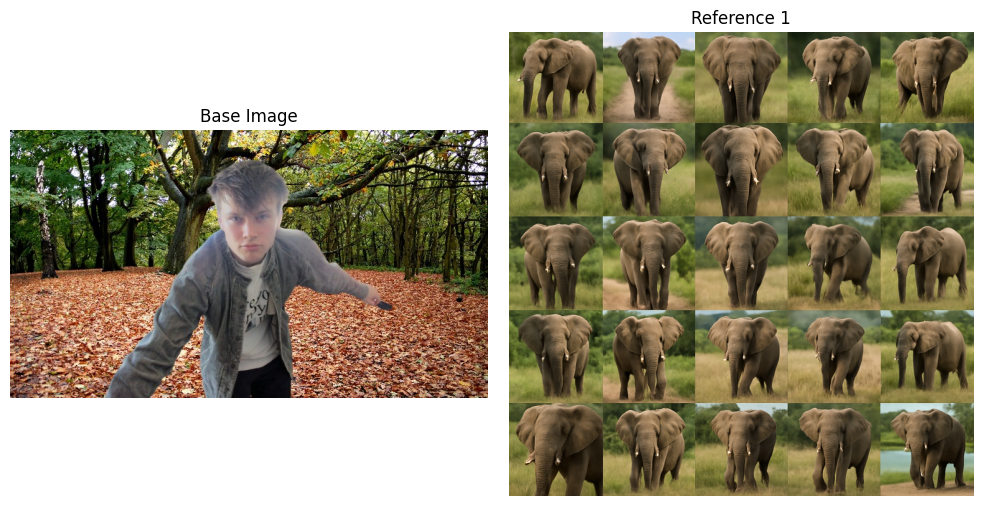

Starting guided dreaming with guidance weight: 0.7
Octaves: 3, Scale: 1.3, Iterations per octave: 200
Using 3 octaves based on image size
Processing octave 1/3 - Size: [375 666]


2025-05-01 17:08:58.301197: W tensorflow/core/framework/op_kernel.cc:1844] UNKNOWN: JIT compilation failed.


UnknownError: Exception encountered when calling BatchNormalization.call().

[1m{{function_node __wrapped__Rsqrt_device_/job:localhost/replica:0/task:0/device:GPU:0}} JIT compilation failed. [Op:Rsqrt] name: [0m

Arguments received by BatchNormalization.call():
  • inputs=tf.Tensor(shape=(1, 187, 332, 32), dtype=float32)
  • training=None
  • mask=None

<Figure size 1500x900 with 0 Axes>

In [54]:
if __name__ == "__main__":

    dreamer = GuidedDeepDream(layers=['mixed6', 'mixed7', 'mixed8'])
    
    result = dreamer.guided_deepdream(
        base_img_path="pictures/forest_floor_background.jpg",
        reference_img_paths=[
            "dream_class_enhancer_images/elephants.png", 
        ],
        output_path="enhanced_elephant_guided_dream.jpg",
        guidance_weight=0.7,
        num_octaves=3,
        octave_scale=1.3,
        iterations_per_octave=200,
        step_size=0.02,
        jitter=32
    )

Model initialized with layers: ['mixed7', 'mixed8', 'mixed9']
Processing at size: (666, 375)


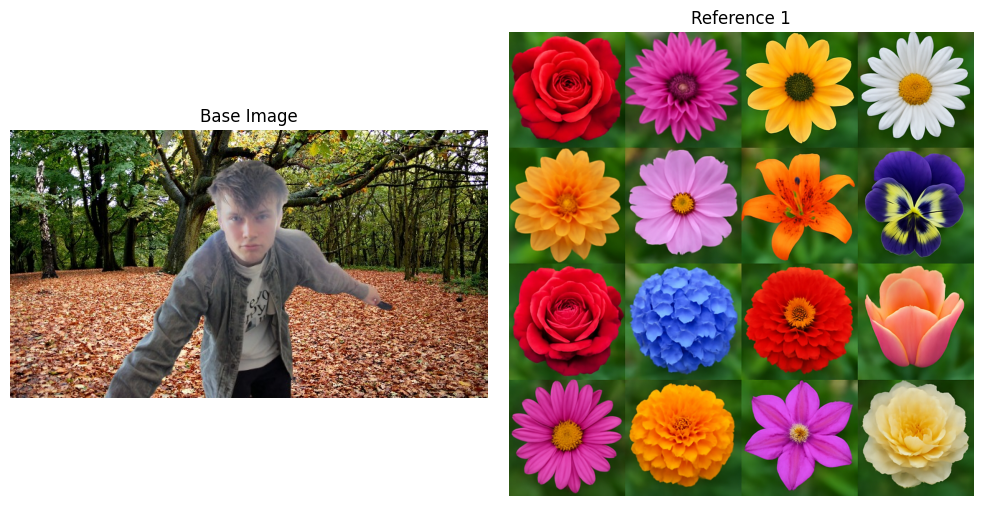

Starting guided dreaming with guidance weight: 0.5
Octaves: 5, Scale: 1.2, Iterations per octave: 50
Using 5 octaves based on image size
Processing octave 1/5 - Size: [375 666]


2025-05-01 17:08:31.119150: W tensorflow/core/framework/op_kernel.cc:1844] UNKNOWN: JIT compilation failed.


UnknownError: Exception encountered when calling BatchNormalization.call().

[1m{{function_node __wrapped__Rsqrt_device_/job:localhost/replica:0/task:0/device:GPU:0}} JIT compilation failed. [Op:Rsqrt] name: [0m

Arguments received by BatchNormalization.call():
  • inputs=tf.Tensor(shape=(1, 187, 332, 32), dtype=float32)
  • training=None
  • mask=None

<Figure size 1500x1500 with 0 Axes>

In [ ]:
if __name__ == "__main__":

    dreamer = GuidedDeepDream(layers=['mixed7', 'mixed8', 'mixed9'])
    
    result = dreamer.guided_deepdream(
        base_img_path="pictures/forest_floor_background.jpg",
        reference_img_paths=[
            "dream_class_enhancer_images/flowers.png", 
        ],
        output_path="flowers_guided_dream.jpg",
        guidance_weight=0.5,
        num_octaves=5,
        octave_scale=1.2,
        iterations_per_octave=50,
        step_size=0.03,
        jitter=16
    )

Model initialized with layers: ['mixed7', 'mixed8', 'mixed9']
Processing at size: (666, 375)


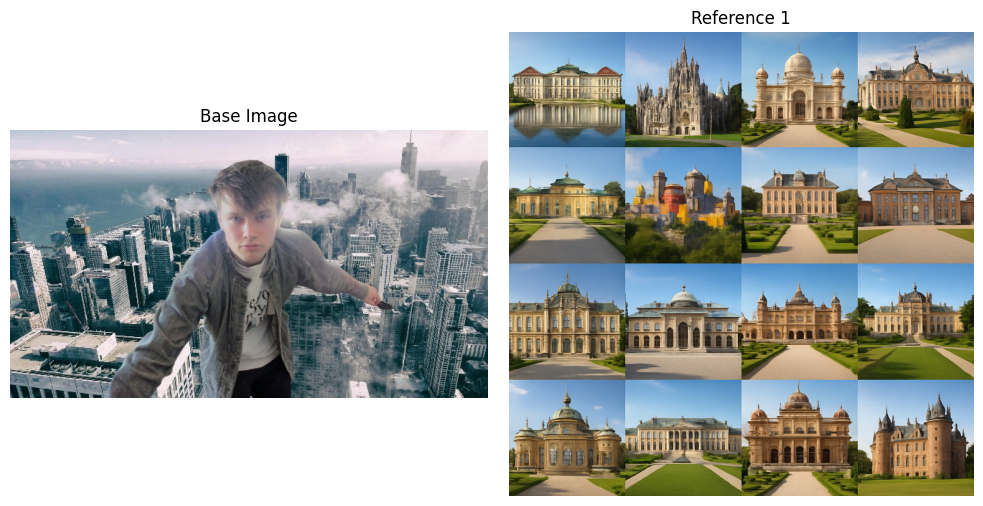

Starting guided dreaming with guidance weight: 0.7
Octaves: 3, Scale: 1.3, Iterations per octave: 50
Using 3 octaves based on image size
Processing octave 1/3 - Size: [375 666]


2025-05-01 17:09:03.112692: W tensorflow/core/framework/op_kernel.cc:1844] UNKNOWN: JIT compilation failed.


UnknownError: Exception encountered when calling BatchNormalization.call().

[1m{{function_node __wrapped__Rsqrt_device_/job:localhost/replica:0/task:0/device:GPU:0}} JIT compilation failed. [Op:Rsqrt] name: [0m

Arguments received by BatchNormalization.call():
  • inputs=tf.Tensor(shape=(1, 187, 332, 32), dtype=float32)
  • training=None
  • mask=None

<Figure size 1500x900 with 0 Axes>

In [55]:
if __name__ == "__main__":

    dreamer = GuidedDeepDream(layers=['mixed7', 'mixed8', 'mixed9'])
    
    result = dreamer.guided_deepdream(
        base_img_path="pictures/city_background.jpg",
        reference_img_paths=[
            "dream_class_enhancer_images/palaces.png", 
        ],
        output_path="palaces_guided_dream.jpg",
        guidance_weight=0.7,
        num_octaves=3,
        octave_scale=1.3,
        iterations_per_octave=50,
        step_size=0.01,
        jitter=32
    )

Model initialized with layers: ['mixed7', 'mixed8', 'mixed9']
Processing at size: (666, 375)


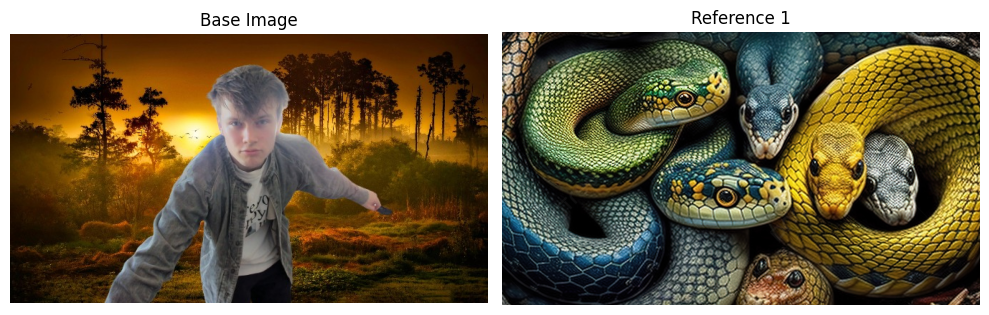

Starting guided dreaming with guidance weight: 0.5
Octaves: 3, Scale: 1.3, Iterations per octave: 400
Using 3 octaves based on image size
Processing octave 1/3 - Size: [375 666]
  Step 1/400 - Loss: 0.4026
  Step 6/400 - Loss: 0.5465
  Step 11/400 - Loss: 0.6163
  Step 16/400 - Loss: 0.6657
  Step 21/400 - Loss: 0.7163
  Step 26/400 - Loss: 0.7282
  Step 31/400 - Loss: 0.7260
  Step 36/400 - Loss: 0.7662
  Step 41/400 - Loss: 0.7407
  Step 46/400 - Loss: 0.7864
  Step 51/400 - Loss: 0.7852
  Step 56/400 - Loss: 0.8115
  Step 61/400 - Loss: 0.7878
  Step 66/400 - Loss: 0.8000
  Step 71/400 - Loss: 0.8048
  Step 76/400 - Loss: 0.7988
  Step 81/400 - Loss: 0.7679
  Step 86/400 - Loss: 0.8292
  Step 91/400 - Loss: 0.8194
  Step 96/400 - Loss: 0.8110
  Step 101/400 - Loss: 0.7996
  Step 106/400 - Loss: 0.8698
  Step 111/400 - Loss: 0.8054
  Step 116/400 - Loss: 0.8338
  Step 121/400 - Loss: 0.8350
  Step 126/400 - Loss: 0.8619
  Step 131/400 - Loss: 0.8374
  Step 136/400 - Loss: 0.8712
  St

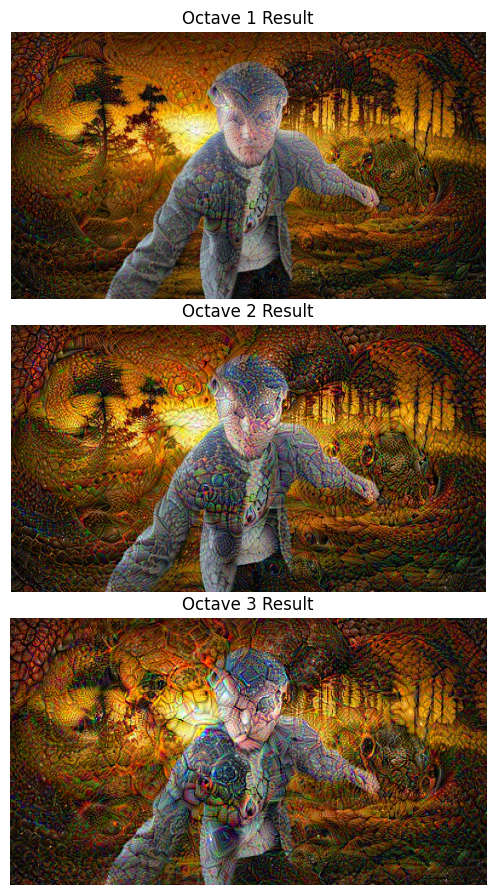

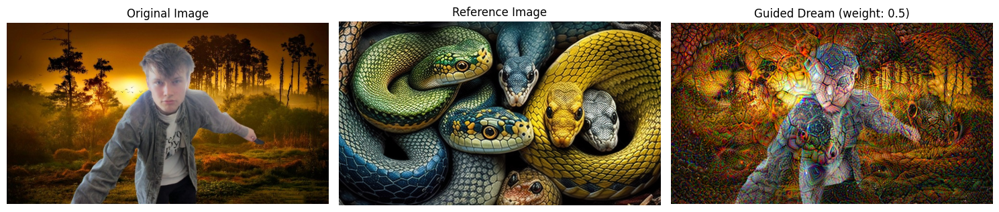

Result saved to snakes_guided_dream.jpg
Processing completed in 235.16 seconds


In [ ]:
if __name__ == "__main__":

    dreamer = GuidedDeepDream(layers=['mixed7', 'mixed8', 'mixed9'])
    
    result = dreamer.guided_deepdream(
        base_img_path="pictures/sunset_forest_background.jpg",
        reference_img_paths=[
            "dream_class_enhancer_images/snakes.jpg", 
        ],
        output_path="snakes_guided_dream.jpg",
        guidance_weight=0.5,
        num_octaves=3,
        octave_scale=1.3,
        iterations_per_octave=400,
        step_size=0.01,
        jitter=32
    )

Model initialized with layers: ['mixed6', 'mixed7', 'mixed8']
Processing at size: (666, 375)


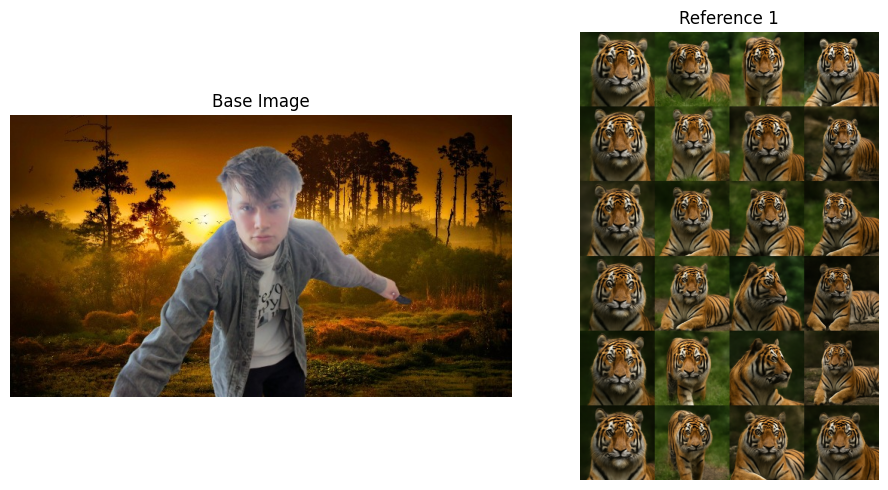

Starting guided dreaming with guidance weight: 0.5
Octaves: 3, Scale: 1.2, Iterations per octave: 150
Using 3 octaves based on image size
Processing octave 1/3 - Size: [375 666]


2025-05-01 17:09:04.992142: W tensorflow/core/framework/op_kernel.cc:1844] UNKNOWN: JIT compilation failed.
2025-05-01 17:09:04.992177: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: UNKNOWN: JIT compilation failed.


UnknownError: Exception encountered when calling BatchNormalization.call().

[1m{{function_node __wrapped__Rsqrt_device_/job:localhost/replica:0/task:0/device:GPU:0}} JIT compilation failed. [Op:Rsqrt] name: [0m

Arguments received by BatchNormalization.call():
  • inputs=tf.Tensor(shape=(1, 187, 332, 32), dtype=float32)
  • training=None
  • mask=None

<Figure size 1500x900 with 0 Axes>

In [56]:
if __name__ == "__main__":

    dreamer = GuidedDeepDream(layers=['mixed6', 'mixed7', 'mixed8'])
    
    result = dreamer.guided_deepdream(
        base_img_path="pictures/sunset_forest_background.jpg",
        reference_img_paths=[
            "dream_class_enhancer_images/tigers.png", 
        ],
        output_path="tigers_guided_dream.jpg",
        guidance_weight=0.5,
        num_octaves=3,
        octave_scale=1.2,
        iterations_per_octave=150,
        step_size=0.02,
        jitter=32
    )

Model initialized with layers: ['mixed7', 'mixed8', 'mixed9']
Processing at size: (2560, 1440)


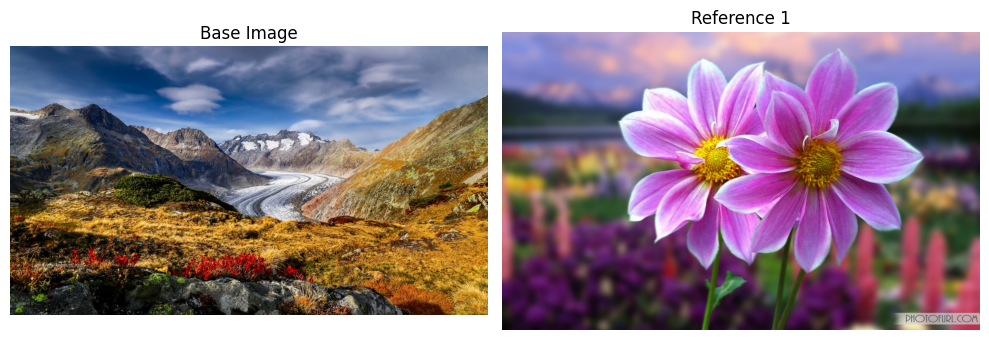

Starting guided dreaming with guidance weight: 0.7
Octaves: 5, Scale: 1.1, Iterations per octave: 150
Using 5 octaves based on image size
Processing octave 1/5 - Size: [1440 2560]
  Step 1/150 - Loss: 0.5258
  Step 6/150 - Loss: 0.6887
  Step 11/150 - Loss: 0.7878
  Step 16/150 - Loss: 0.7610
  Step 21/150 - Loss: 0.8224
  Step 26/150 - Loss: 0.8483
  Step 31/150 - Loss: 0.8369
  Step 36/150 - Loss: 0.9052
  Step 41/150 - Loss: 0.8392
  Step 46/150 - Loss: 0.9074
  Step 51/150 - Loss: 0.8780
  Step 56/150 - Loss: 0.8320
  Step 61/150 - Loss: 0.8614
  Step 66/150 - Loss: 0.8562
  Step 71/150 - Loss: 0.8930
  Step 76/150 - Loss: 0.9173
  Step 81/150 - Loss: 0.9156
  Step 86/150 - Loss: 0.9481
  Step 91/150 - Loss: 0.9781
  Step 96/150 - Loss: 0.9155
  Step 101/150 - Loss: 1.0145
  Step 106/150 - Loss: 0.8623
  Step 111/150 - Loss: 0.9002
  Step 116/150 - Loss: 0.9363
  Step 121/150 - Loss: 0.9292
  Step 126/150 - Loss: 0.9673
  Step 131/150 - Loss: 0.9706
  Step 136/150 - Loss: 0.9479
  

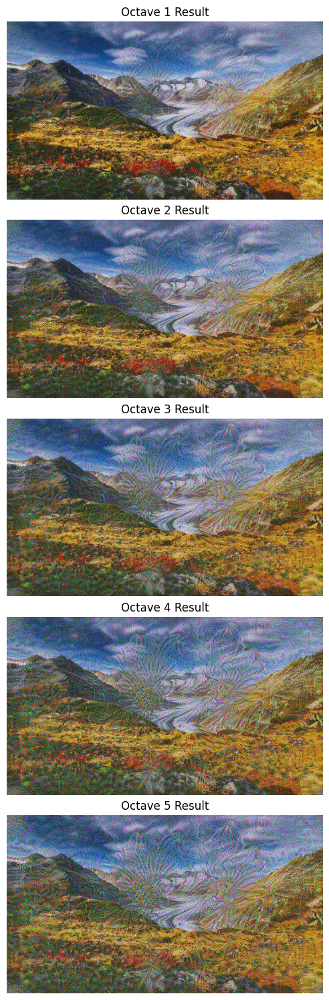

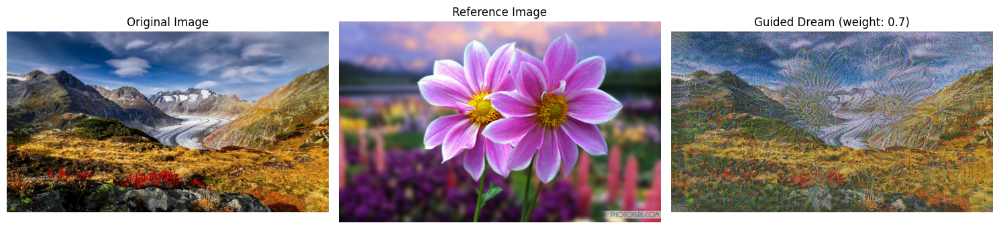

Result saved to flowers_guided_dream.jpg
Processing completed in 164.98 seconds


In [ ]:
if __name__ == "__main__":

    dreamer = GuidedDeepDream(layers=['mixed7', 'mixed8', 'mixed9'])
    
    result = dreamer.guided_deepdream(
        base_img_path="pictures/mountains.jpg",
        reference_img_paths=[
            "dream_class_enhancer_images/flower.jpg", 
        ],
        output_path="flowers_guided_dream.jpg",
        guidance_weight=0.7,
        num_octaves=5,
        octave_scale=1.1,
        iterations_per_octave=150,
        step_size=0.04,
        jitter=64
    )